## Global Runoff Data Center streamflow data pre-processing

#### The main objective of this script is to perform a pre-processing analysis of the available streamflow data from the GRDC, having a close look at the countries, time-lengh availability and gaps.

Written by: Thiago Victor Medeiros do Nascimento

References:

1. Global Runoff Data Center: https://www.bafg.de/GRDC/EN/Home/homepage_node.html

First we import some useful modules:

In [3]:
import geopandas as gpd                                      # Pandas for geospatial analysis
from shapely.geometry import Point, Polygon                  # Module used for geospatial analysis     
import pymannkendall as mk                                   # Module used for trend-computation
from plotly.offline import plot
import contextily as cx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings                                              
import datetime                                              # Datetime module pretty useful for time-series analysis
import tqdm as tqdm                                          # Useful module to access the progress bar of a loop
import os
import glob
warnings.simplefilter(action='ignore', category=Warning)     # Module useful for taking out some unecessary warnings


%config Completer.use_jedi = False                           # This improve the auto-fill function

import geospatialfunctions as geospatialfunctions            # Geospatialfunctions is a module with useful functions

First we should set our directory:

In [4]:
path = r"C:\Users\nascimth\Documents\Thiago\Eawag\Python\Datasets"
os.chdir(path)
os.getcwd()

'C:\\Users\\nascimth\\Documents\\Thiago\\Eawag\\Python\\Datasets'

Here we can import the full GRDC network information:

In [5]:
network = pd.read_excel(r'GRDC\grdc_stations\GRDC_Stations.xlsx', skiprows=0)
network

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
0,1104150,1,1041,OUED CHELIF,SIDI BELATAR,DZ,36.020000,0.270000,43750.0,2.0,...,1976.0,1977.0,2.0,0.0,1976,2001,26,15.027,0.473891,10.831805
1,1104200,1,1041,OUED MINA,OUED EL-ABTAL,DZ,35.500000,0.680000,6635.0,205.0,...,1976.0,1978.0,3.0,0.0,1976,1978,3,2.578,0.0813,12.253174
2,1104300,1,1041,OUED GHIOU,AMMI MOUSSA,DZ,35.870000,1.120000,2398.0,140.0,...,1976.0,1979.0,4.0,0.0,1976,1979,4,3.195,0.100758,42.017314
3,1104450,1,1040,OUED MAZAFRAN,FER A CHEVAL,DZ,36.670000,2.820000,1912.0,10.0,...,1976.0,1978.0,3.0,0.0,1976,1995,20,3.379,0.10656,55.732293
4,1104480,1,1040,OUED BOU DOUAOU,KEDDARA,DZ,36.650000,3.420000,829.0,60.0,...,1976.0,1979.0,4.0,0.0,1976,1979,4,0.354,0.011164,13.466519
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10699,6987100,6,6870,SHAKHE,SOLOKHAUL,RU,43.799444,39.678056,423.0,133.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,29.333,0.925045,2186.868766
10700,6987150,6,6870,SOCHI,PLASTUNKA,RU,43.680556,39.822222,238.0,-999.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,15.585,0.491489,2065.077983
10701,6998200,6,6984,KANGERLUARSUNNGUUP KUUA,KOBBEFJORD HYDROMETRIC STATION,DK,64.133110,-51.380780,31.0,22.0,...,NaN,NaN,NaN,NaN,2006,2020,15,1.219,0.038442,1240.076903
10702,6998300,6,6984,KUUSSUAQ,QEQERTARSUAQ,DK,69.253620,-53.498230,100.0,7.0,...,NaN,NaN,NaN,NaN,2015,2021,7,n.a.,n.a.,n.a.


Here we select only Europe (WMO = 6):

In [6]:
network_eu = network[network.wmo_reg == 6]
network_eu

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7737,6111100,6,6111,RIO MINO,FOZ DO MOURO,PT,42.077000,-8.391000,15407.2,12.0,...,1976.0,1984.0,9.0,0.0,1976,1989,14,343.465,10.831512,703.016268
7738,6112070,6,6121,RIO PAIVA,CASTRO DAIRE,PT,40.892000,-7.933000,288.3,459.0,...,1976.0,1984.0,9.0,0.0,1972,1985,14,6.997,0.220657,765.374235
7739,6112080,6,6121,RIO TAMEGA,PONTE CANAVEZES (R.E.),PT,41.195000,-8.161000,3163.3,67.0,...,1976.0,1984.0,9.0,0.0,1955,1987,33,70.98,2.238425,707.623457
7740,6112090,6,6121,RIO DOURO,RÉGUA,PT,41.154000,-7.782000,91505.6,67.0,...,1933.0,1969.0,37.0,0.0,1933,1969,37,542.042,17.093837,186.806452
7741,6112100,6,6121,RIO DOURO,POCINHO,PT,41.159000,-7.114000,81293.9,113.0,...,1973.0,1975.0,3.0,0.0,1973,1975,3,314.262,9.910566,121.910333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10699,6987100,6,6870,SHAKHE,SOLOKHAUL,RU,43.799444,39.678056,423.0,133.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,29.333,0.925045,2186.868766
10700,6987150,6,6870,SOCHI,PLASTUNKA,RU,43.680556,39.822222,238.0,-999.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,15.585,0.491489,2065.077983
10701,6998200,6,6984,KANGERLUARSUNNGUUP KUUA,KOBBEFJORD HYDROMETRIC STATION,DK,64.133110,-51.380780,31.0,22.0,...,NaN,NaN,NaN,NaN,2006,2020,15,1.219,0.038442,1240.076903
10702,6998300,6,6984,KUUSSUAQ,QEQERTARSUAQ,DK,69.253620,-53.498230,100.0,7.0,...,NaN,NaN,NaN,NaN,2015,2021,7,n.a.,n.a.,n.a.


In [7]:
#Quick check of the columns' types:
network_eu.dtypes

grdc_no            int64
wmo_reg            int64
sub_reg            int64
river             object
station           object
country           object
lat              float64
long             float64
area             float64
altitude         float64
d_start          float64
d_end            float64
d_yrs            float64
d_miss           float64
m_start          float64
m_end            float64
m_yrs            float64
m_miss           float64
t_start            int64
t_end              int64
t_yrs              int64
lta_discharge     object
r_volume_yr       object
r_height_yr       object
dtype: object

In [8]:
# At this part it is important to convert our columns representing dates to datetime:
network_eu["d_start"] = pd.to_datetime(network_eu['d_start'], format='%Y')
network_eu["d_end"] = pd.to_datetime(network_eu['d_end'], format='%Y')       

network_eu

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7737,6111100,6,6111,RIO MINO,FOZ DO MOURO,PT,42.077000,-8.391000,15407.2,12.0,...,1976.0,1984.0,9.0,0.0,1976,1989,14,343.465,10.831512,703.016268
7738,6112070,6,6121,RIO PAIVA,CASTRO DAIRE,PT,40.892000,-7.933000,288.3,459.0,...,1976.0,1984.0,9.0,0.0,1972,1985,14,6.997,0.220657,765.374235
7739,6112080,6,6121,RIO TAMEGA,PONTE CANAVEZES (R.E.),PT,41.195000,-8.161000,3163.3,67.0,...,1976.0,1984.0,9.0,0.0,1955,1987,33,70.98,2.238425,707.623457
7740,6112090,6,6121,RIO DOURO,RÉGUA,PT,41.154000,-7.782000,91505.6,67.0,...,1933.0,1969.0,37.0,0.0,1933,1969,37,542.042,17.093837,186.806452
7741,6112100,6,6121,RIO DOURO,POCINHO,PT,41.159000,-7.114000,81293.9,113.0,...,1973.0,1975.0,3.0,0.0,1973,1975,3,314.262,9.910566,121.910333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10699,6987100,6,6870,SHAKHE,SOLOKHAUL,RU,43.799444,39.678056,423.0,133.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,29.333,0.925045,2186.868766
10700,6987150,6,6870,SOCHI,PLASTUNKA,RU,43.680556,39.822222,238.0,-999.0,...,1978.0,1987.0,10.0,0.0,1978,1987,10,15.585,0.491489,2065.077983
10701,6998200,6,6984,KANGERLUARSUNNGUUP KUUA,KOBBEFJORD HYDROMETRIC STATION,DK,64.133110,-51.380780,31.0,22.0,...,NaN,NaN,NaN,NaN,2006,2020,15,1.219,0.038442,1240.076903
10702,6998300,6,6984,KUUSSUAQ,QEQERTARSUAQ,DK,69.253620,-53.498230,100.0,7.0,...,NaN,NaN,NaN,NaN,2015,2021,7,n.a.,n.a.,n.a.


Here we can plot our dataset using one of the geospatialfunctions function:

In [9]:
coords = network_eu[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)
coords.astype(float)

geospatialfunctions.plotpoints(coords)

AttributeError: module 'geospatialfunctions' has no attribute 'plotpoints'

Here we can check all the country' symbols within our dataset:

In [10]:
countries = network_eu["country"].unique().tolist()
countries

['PT',
 'FR',
 'CZ',
 'SK',
 'EE',
 'CY',
 'ES',
 'BE',
 'SE',
 'AT',
 'BY',
 'GR',
 'DE',
 'IT',
 'LV',
 'AM',
 'SY',
 'IS',
 'NL',
 'HU',
 'PL',
 'IE',
 'RS',
 'SI',
 'BA',
 'MK',
 'LT',
 'AZ',
 'IL',
 'GB',
 'UA',
 'HR',
 'AL',
 'TR',
 'NO',
 'RO',
 'MD',
 'JO',
 'FI',
 'LU',
 'BG',
 'GE',
 'RU',
 'DK',
 'CH']

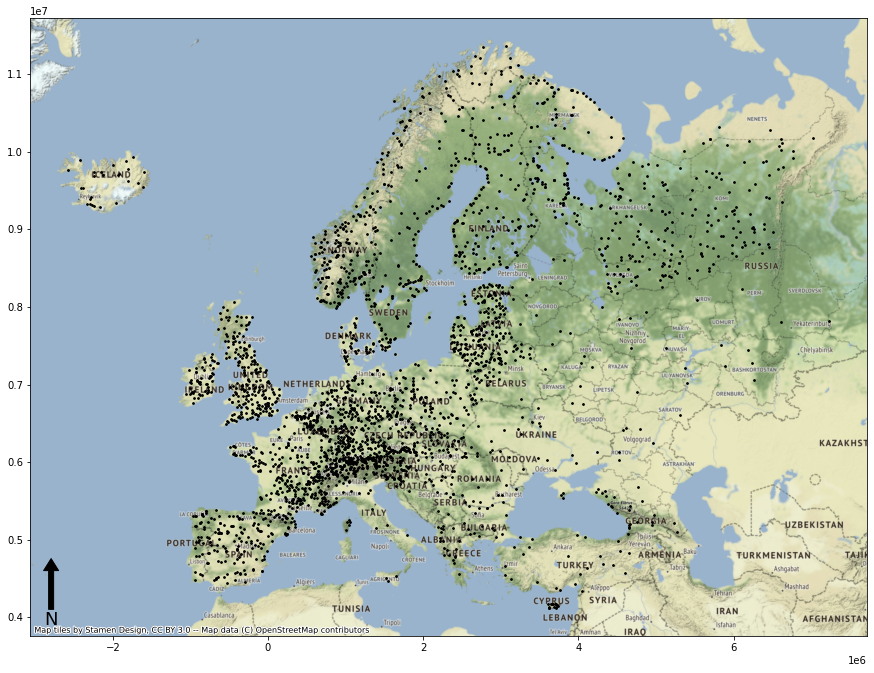

In [12]:
#This list takes only countries within Europe:
countries_used = ['PT', 'FR', 'CZ', 'SK', 'EE', 'CY', 'ES', 'BE', 'SE', 'AT', 'BY', 'GR', 'DE', 'IT', 'LV', 
                  'IS', 'NL', 'HU', 'PL', 'IE', 'RS', 'SI', 'BA', 'MK', 'LT', 'GB', 'UA', 'HR', 'AL', 
                  'TR', 'NO', 'RO', 'MD', 'FI', 'LU', 'BG', 'GE', 'RU', 'DK', 'CH']

network_eu_2 = network_eu.loc[network_eu.apply(lambda x: x.country in countries_used, axis=1)]


# We can also take out some domains from Denmark and Norway:
stations_out = [6998300, 6998200, 6998400, 6730710, 6730700]

for station in stations_out:
    network_eu_2.drop(network_eu_2[network_eu_2['grdc_no'] == station].index, inplace = True)

# Finally we can plot our available data:
coords = network_eu_2[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)
geospatialfunctions.plotpointsmap(coords)

##### We chose to keep the countries which we have official information from their respective websites or published databases such as CAMELS, but we will give priority for the last prior to the GRDC.

2. Conditional filters:

At this part we can start with some conditional filters in order to select only datasets with potential usable data based on their reported start and end dates.

In [13]:
network_cond_1 = network_eu_2[network_eu_2.d_start < "1995"]
network_cond_1

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7737,6111100,6,6111,RIO MINO,FOZ DO MOURO,PT,42.077000,-8.391000,15407.2,12.0,...,1976.0,1984.0,9.0,0.000000,1976,1989,14,343.465,10.831512,703.016268
7738,6112070,6,6121,RIO PAIVA,CASTRO DAIRE,PT,40.892000,-7.933000,288.3,459.0,...,1976.0,1984.0,9.0,0.000000,1972,1985,14,6.997,0.220657,765.374235
7739,6112080,6,6121,RIO TAMEGA,PONTE CANAVEZES (R.E.),PT,41.195000,-8.161000,3163.3,67.0,...,1976.0,1984.0,9.0,0.000000,1955,1987,33,70.98,2.238425,707.623457
7742,6113050,6,6131,TAGUS RIVER,ALMOUROL,PT,39.461000,-8.375000,67482.3,19.0,...,1973.0,1990.0,18.0,5.882353,1973,1990,18,342.692,10.807135,160.147697
7746,6114150,6,6140,RIO VOUGA,PONTE VOUZELA,PT,40.733000,-8.112000,648.8,159.0,...,1980.0,1984.0,5.0,3.333333,1980,1990,11,13.017,0.410504,632.712873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10695,6984700,6,6841,KAZIKUMUKHSKOYE KOYSU,GUERGUEBIL,RU,42.386667,46.960556,1850.0,655.0,...,1978.0,1987.0,10.0,10.000000,1978,1987,10,13.449,0.424128,229.258197
10696,6984800,6,6841,KARA-SAMUR,LUCHEK,RU,41.611667,47.307222,481.0,1436.0,...,1965.0,1984.0,20.0,0.000000,1965,1987,23,8.784,0.277012,575.90899
10698,6987050,6,6870,PSEZUAPSE,TAT'YANOVKA,RU,43.959167,39.409167,255.0,-999.0,...,1978.0,1987.0,10.0,0.000000,1978,1987,10,13.962,0.440306,1726.688753
10699,6987100,6,6870,SHAKHE,SOLOKHAUL,RU,43.799444,39.678056,423.0,133.0,...,1978.0,1987.0,10.0,0.000000,1978,1987,10,29.333,0.925045,2186.868766


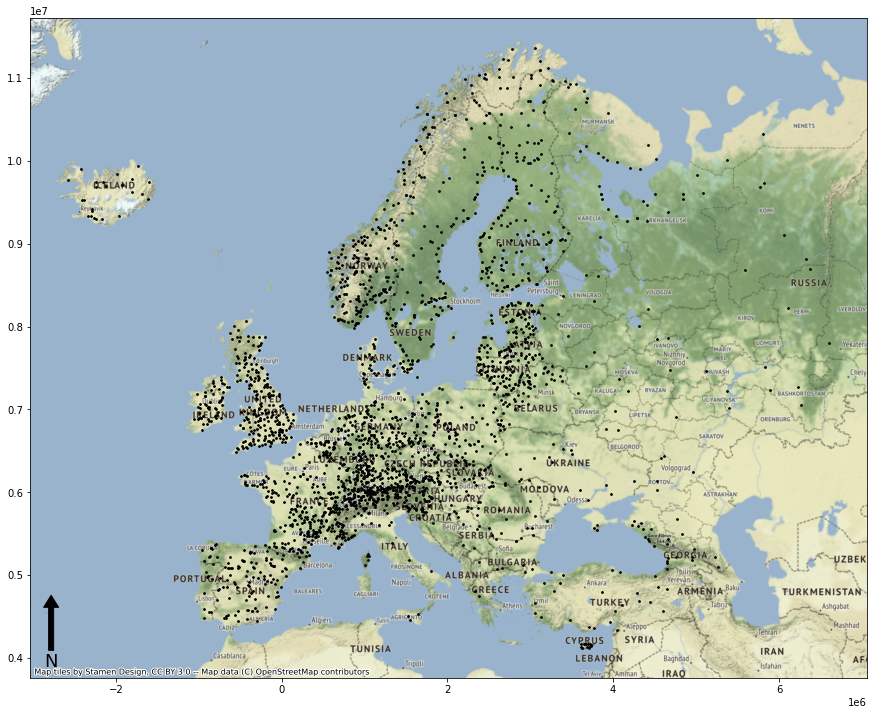

In [15]:
# Finally we can plot our available data:
coords = network_cond_1[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)
geospatialfunctions.plotpointsmap(coords)

In [16]:
network_cond_2 = network_cond_1[network_cond_1.d_end > "2000"]
network_cond_2

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7753,6118130,6,6180,ABER VRAC'H,DRENNEC,FR,48.530410,-4.362693,24.0,90.60,...,NaN,NaN,NaN,NaN,1966,2012,47,0.448,0.014128,588.672
7754,6118150,6,6180,GUILLEC,TREZILIDE,FR,48.615037,-4.077011,43.0,91.10,...,NaN,NaN,NaN,NaN,1966,2012,47,0.682,0.021508,500.175628
7755,6118160,6,6180,PENZE,TAULE (PENHOAT),FR,48.584822,-3.924127,141.0,61.97,...,NaN,NaN,NaN,NaN,1967,2012,46,2.813,0.088711,629.154383
7756,6118165,6,6180,RISLE,RAI,FR,48.747942,0.580580,149.0,255.45,...,NaN,NaN,NaN,NaN,1965,2012,48,1.379,0.043488,291.866738
7757,6118175,6,6180,JARLOT,PLOUGONVEN,FR,48.565562,-3.800485,44.0,73.86,...,NaN,NaN,NaN,NaN,1966,2012,47,0.712,0.022454,510.309818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10607,6971130,6,6712,TULOMA,VERKHNE-TULOMSKIY GES,RU,68.600000,31.750000,17500.0,-999.00,...,1934.0,2017.0,84.0,25.349301,1934,2017,84,193.903,6.114925,349.424286
10643,6971600,6,6713,VARZUGA,VARZUGA,RU,66.400000,36.300000,7940.0,9.00,...,1935.0,1992.0,58.0,0.288600,1935,2011,77,91.75,2.893428,364.411587
10673,6977100,6,6771,VOLGA,VOLGOGRAD POWER PLANT,RU,48.804722,44.585833,1360000.0,-999.00,...,1879.0,1984.0,106.0,17.924528,1879,2010,132,7827.676,246.85359,181.509993
10676,6978250,6,6781,DON,RAZDORSKAYA,RU,47.540833,40.647222,378000.0,58.00,...,1881.0,1984.0,104.0,3.453815,1881,2010,130,681.961,21.506322,56.895032


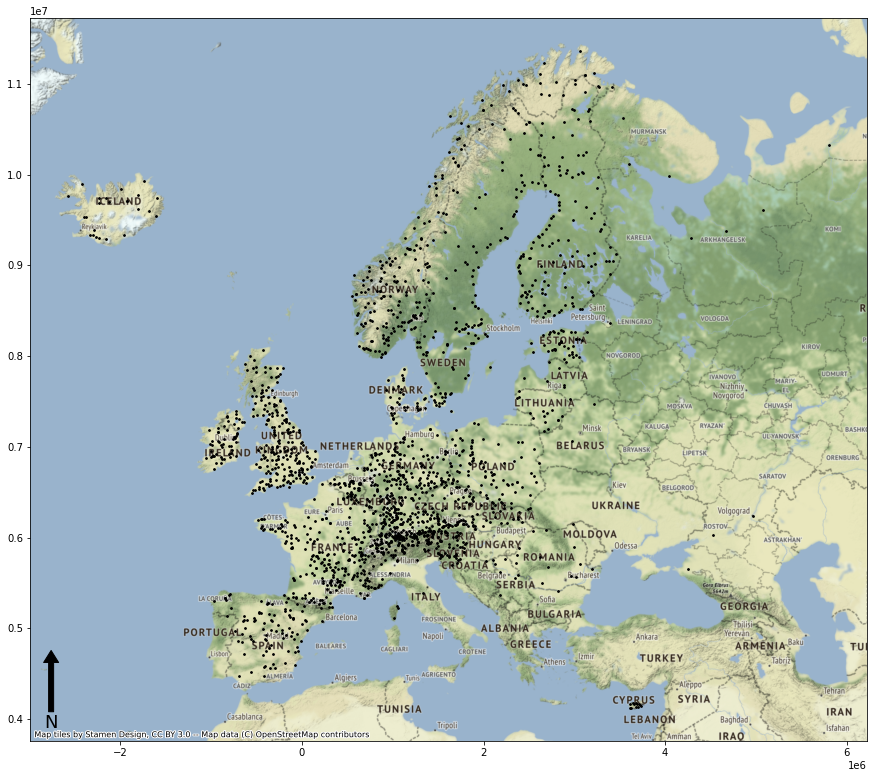

In [17]:
coords = network_cond_2[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)

geospatialfunctions.plotpointsmap(coords)

Here we can provide a quick overlook at the last and first year of daily streamflow data availability:

<AxesSubplot:title={'center':'Last year of available daily data'}>

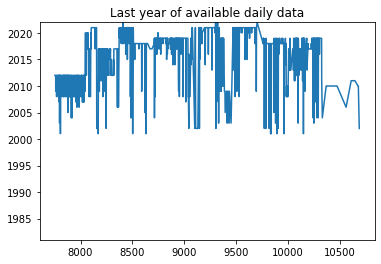

In [18]:
network_cond_2.d_end.plot(title = "Last year of available daily data", 
                          ylim = [datetime.date(1981, 1, 1), datetime.date(2022, 1, 1)])

<AxesSubplot:title={'center':'First year of available daily data'}>

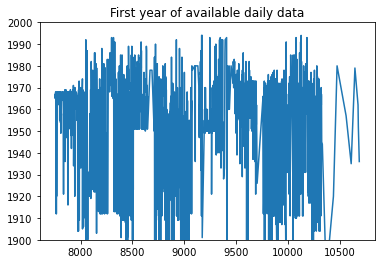

In [19]:
network_cond_2.d_start.plot(title = "First year of available daily data", 
                            ylim = [datetime.date(1900, 1, 1), datetime.date(2000, 1, 1)])

Here we can have a small check analysing data for a specific country:

In [17]:
network_DE = network_cond_2[network_cond_2.country == "DE"]
network_DE

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
8709,6321100,6,6211,NIERS,GOCH,DE,51.684000,6.151000,1203.0,12.02,...,NaN,NaN,NaN,NaN,1950,2018,69,7.74,0.244089,202.89995
8710,6321200,6,6211,ROER,STAH,DE,51.097604,6.104184,2105.0,32.45,...,NaN,NaN,NaN,NaN,1960,2018,59,21.534,0.679096,322.611033
8711,6334270,6,6340,SOHOLMER AU,SOHOLM,DE,54.699745,9.022802,352.0,1.70,...,NaN,NaN,NaN,NaN,1984,2019,36,4.85,0.15295,434.515909
8712,6334280,6,6340,LECKER AU,LECK-KARLSMARK,DE,54.770658,8.976074,134.0,2.31,...,NaN,NaN,NaN,NaN,1984,2004,21,1.877,0.059193,441.739343
8713,6334800,6,6340,TREENE,TREIA,DE,54.514342,9.317255,481.0,5.00,...,NaN,NaN,NaN,NaN,1931,2019,89,6.453,0.203502,423.080682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9065,6357501,6,6571,LUSATIAN NEISSE RIVER,GUBEN 2,DE,51.969270,14.706722,4080.0,37.48,...,NaN,NaN,NaN,NaN,1959,2019,61,28.432,0.896632,219.762635
9066,6357502,6,6571,LUSATIAN NEISSE RIVER,GOERLITZ,DE,51.161160,14.993192,1621.0,175.63,...,NaN,NaN,NaN,NaN,1912,2019,108,16.879,0.532296,328.375166
9067,6357503,6,6571,LUSATIAN NEISSE RIVER,HARTAU,DE,50.872211,14.821047,376.0,233.14,...,NaN,NaN,NaN,NaN,1957,2016,60,5.849,0.184454,490.569319
9069,6357510,6,6571,PLIESSNITZ,TAUCHRITZ,DE,51.064069,14.944133,162.0,197.20,...,NaN,NaN,NaN,NaN,1964,2019,56,1.096,0.034563,213.354667


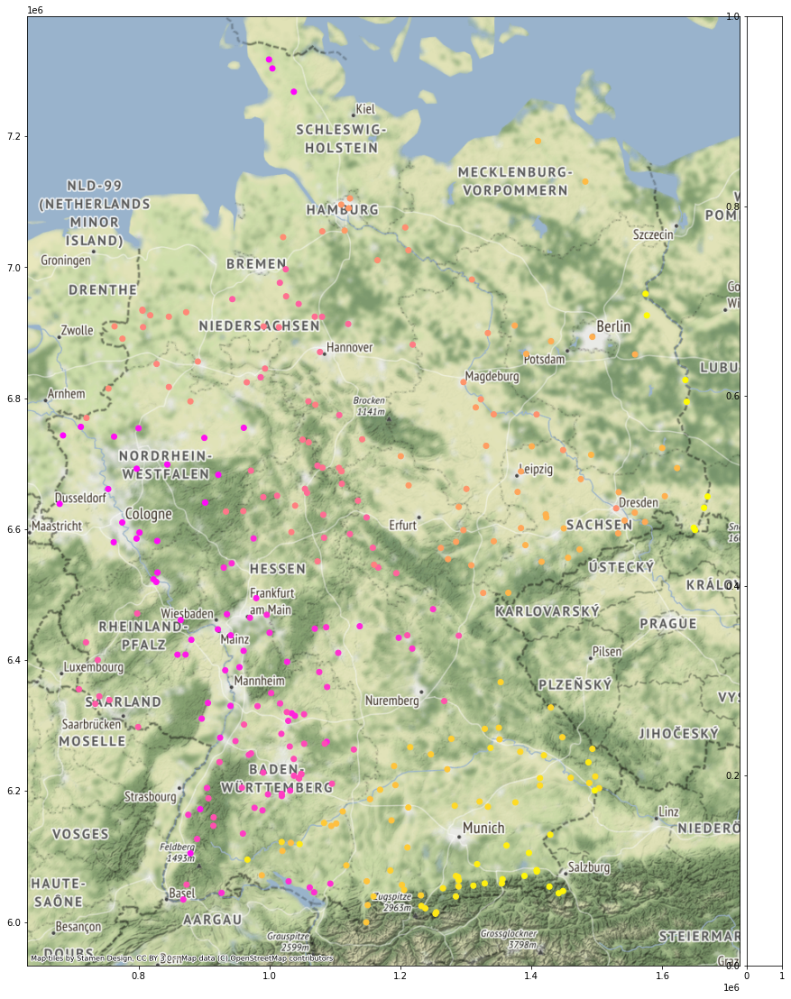

In [18]:
coords = network_DE[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)

geospatialfunctions.plotpoints(coords)

<AxesSubplot:title={'center':'Last year of available daily data'}>

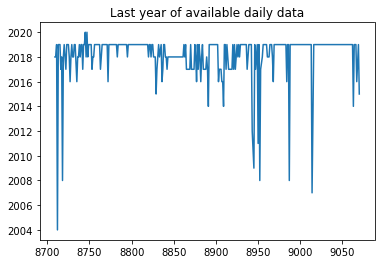

In [19]:
network_DE.d_end.plot(title = "Last year of available daily data")

<AxesSubplot:title={'center':'First year of available daily data'}>

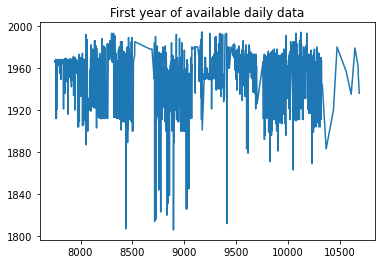

In [20]:
network_cond_2.d_start.plot(title = "First year of available daily data")

With this, we can use the stations called network_cond_2 as the ones to build our time-series data frames with.

3. Full time-series organization:

At this part we can organize the time-series in a single dataframe where each column will represent a different station, and each row a different date.

In [20]:
# First we can check our files within the folder:
path =r'GRDC\original'
filenames = glob.glob(path + "/*.txt")
len(filenames)

2967

Here we can use a for loop to retrieve each station, organize which information is needed, an concatenate everything together:

In [21]:
i = 0
timeseriesfinal = pd.DataFrame(index = pd.date_range('09-01-1900','09-30-2022', freq='D'))

#### The tqdm module is useful for checking the progress bar of the loop.
for filename in tqdm.tqdm(filenames):
    # First we read our time-series:
    data = pd.read_csv(filename, encoding='latin-1', engine='python', skiprows = 36, delimiter = ";", usecols = [0, 2])

    # We define new column names:
    names = ['dates', 'Qm3s']
    data.columns = names

    # Convert our column of dates to datetime format:
    data["dates"] = pd.to_datetime(data["dates"], format='%Y-%m-%d')

    # We can replace the -999.0 to np.nan:
    data.Qm3s.replace(-999.0, np.nan, inplace=True)

    # Here we can set the index as the dates column:
    data.set_index("dates", inplace = True)

    # First we can retrieve the station name:
    namestation = os.path.basename(filename)
    namestation = namestation.split("_", 1)[0]
    
    timeseriesfinal.loc[:, int(namestation)] = data.Qm3s

100%|██████████████████████████████████████████████████████████████████████████████| 2967/2967 [04:01<00:00, 12.28it/s]


In [22]:
timeseriesfinal

,6111100,6112070,6112080,6112090,6112100,6113050,6113100,6113110,6114100,6114150,...,6984500,6984700,6984800,6986100,6987050,6987100,6987150,6998200,6998300,6998400
1900-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
timeseriesfinal.to_csv(r'GRDC\timeseries\timeseries_grdc.csv') 
network_cond_2.to_csv(r'GRDC\timeseries\network_cond_2.csv') 

4. Gaps check:

At this part we can check for gaps in our time-series:

In [3]:
#First we read our data:
timeseriesfinal = pd.read_csv(r'GRDC\timeseries\timeseries_grdc.csv', encoding='latin-1', engine='python', delimiter = ",",
                             index_col = 0)

timeseriesfinal

,6111100,6112070,6112080,6112090,6112100,6113050,6113100,6113110,6114100,6114150,...,6984500,6984700,6984800,6986100,6987050,6987100,6987150,6998200,6998300,6998400
1900-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


For some reason the date.index was not set as datetime, so we should set it in order to acheive all the capabilities of the other functions. 

In [4]:
timeseriesfinal.index = pd.to_datetime(timeseriesfinal.index)
type(timeseriesfinal.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [5]:
# If we do not convert, we will not be able to make some compatiblization.
timeseriesfinal.columns = timeseriesfinal.columns.astype(int)

In [6]:
# Fist we check the stations used:
network_cond_2 = pd.read_csv(r'GRDC\timeseries\network_cond_2.csv', encoding='latin-1', engine='python', delimiter = ",",
                             index_col = 0)
network_cond_2

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7753,6118130,6,6180,ABER VRAC'H,DRENNEC,FR,48.530410,-4.362693,24.0,90.60,...,NaN,NaN,NaN,NaN,1966,2012,47,0.448,0.014128128,588.672
7754,6118150,6,6180,GUILLEC,TREZILIDE,FR,48.615037,-4.077011,43.0,91.10,...,NaN,NaN,NaN,NaN,1966,2012,47,0.682,0.021507552,500.1756279069768
7755,6118160,6,6180,PENZE,TAULE (PENHOAT),FR,48.584822,-3.924127,141.0,61.97,...,NaN,NaN,NaN,NaN,1967,2012,46,2.813,0.08871076800000001,629.1543829787234
7756,6118165,6,6180,RISLE,RAI,FR,48.747942,0.580580,149.0,255.45,...,NaN,NaN,NaN,NaN,1965,2012,48,1.379,0.043488144,291.8667382550336
7757,6118175,6,6180,JARLOT,PLOUGONVEN,FR,48.565562,-3.800485,44.0,73.86,...,NaN,NaN,NaN,NaN,1966,2012,47,0.712,0.022453632,510.3098181818181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10607,6971130,6,6712,TULOMA,VERKHNE-TULOMSKIY GES,RU,68.600000,31.750000,17500.0,-999.00,...,1934.0,2017.0,84.0,25.349301,1934,2017,84,193.903,6.114925008,349.4242861714285
10643,6971600,6,6713,VARZUGA,VARZUGA,RU,66.400000,36.300000,7940.0,9.00,...,1935.0,1992.0,58.0,0.288600,1935,2011,77,91.75,2.893428,364.4115869017632
10673,6977100,6,6771,VOLGA,VOLGOGRAD POWER PLANT,RU,48.804722,44.585833,1360000.0,-999.00,...,1879.0,1984.0,106.0,17.924528,1879,2010,132,7827.676,246.853590336,181.5099928941177
10676,6978250,6,6781,DON,RAZDORSKAYA,RU,47.540833,40.647222,378000.0,58.00,...,1881.0,1984.0,104.0,3.453815,1881,2010,130,681.961,21.506322096,56.895032


In [7]:
# Here we can create a list with the stations names:
stations_used = network_cond_2.grdc_no.tolist()

In [8]:
# Finally we create a time-series with only the stations used:
timeseriesfinal_used = timeseriesfinal.loc[:, stations_used]

timeseriesfinal_used

,6118130,6118150,6118160,6118165,6118175,6118185,6118195,6118205,6118230,6119010,...,6970100,6970250,6970500,6970700,6970869,6971130,6971600,6977100,6978250,6983350
1900-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# This auxiliar dataframe is used to better plot our dataset:
coords = network_cond_2[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)
coords

,long,lat
grdc_no,,
6118130,-4.362693,48.530410
6118150,-4.077011,48.615037
6118160,-3.924127,48.584822
6118165,0.580580,48.747942
6118175,-3.800485,48.565562
...,...,...
6971130,31.750000,68.600000
6971600,36.300000,66.400000
6977100,44.585833,48.804722


In [10]:
summarygapsstations = geospatialfunctions.summarygaps(timeseriesfinal_used.loc["1981":"2018",:], coords)
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps
Code,,,,
6118130,-4.362693,48.530410,2412.0,17.378774
6118150,-4.077011,48.615037,2399.0,17.285107
6118160,-3.924127,48.584822,2408.0,17.349953
6118165,0.580580,48.747942,3486.0,25.117083
6118175,-3.800485,48.565562,2578.0,18.574825
...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723
6971600,36.300000,66.400000,2922.0,21.053390
6977100,44.585833,48.804722,3287.0,23.683262


<AxesSubplot:xlabel='Code'>

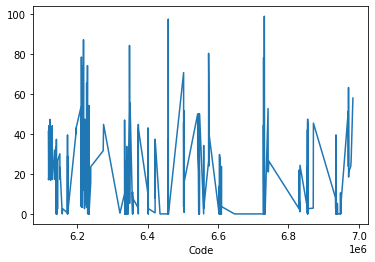

In [11]:
summarygapsstations.PercentageGaps.plot()

Here we can plot the gaps:

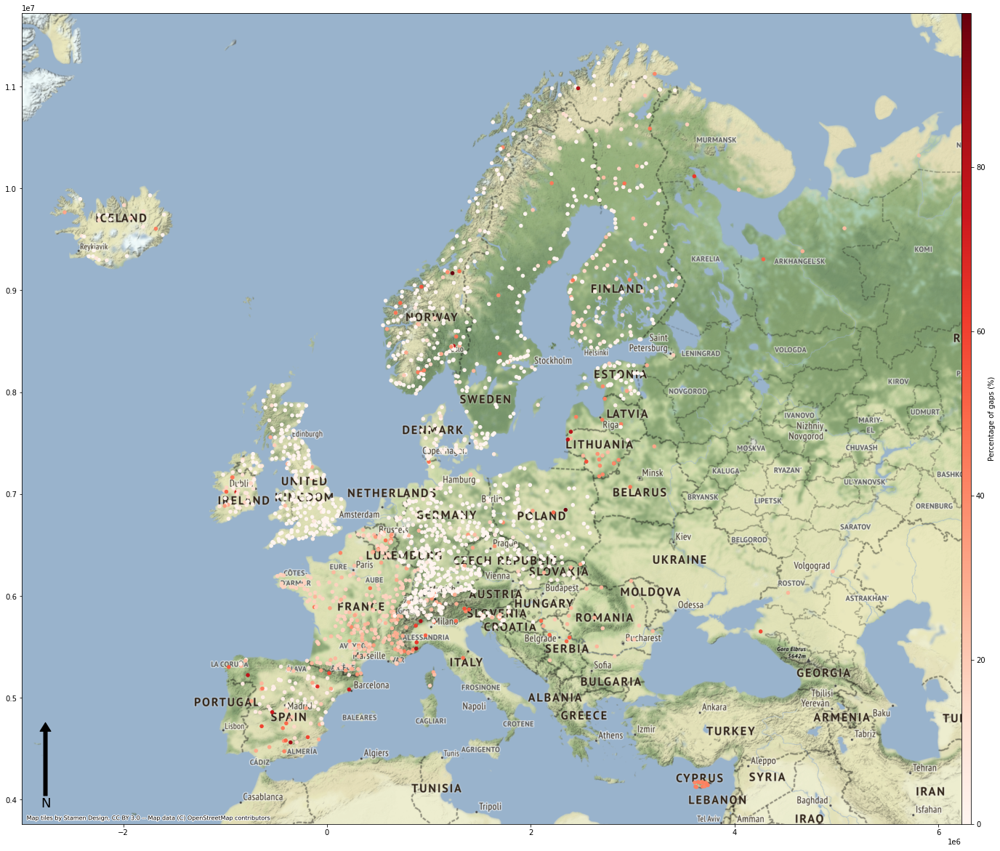

In [12]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations, crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (23.4, 23.4), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 20,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

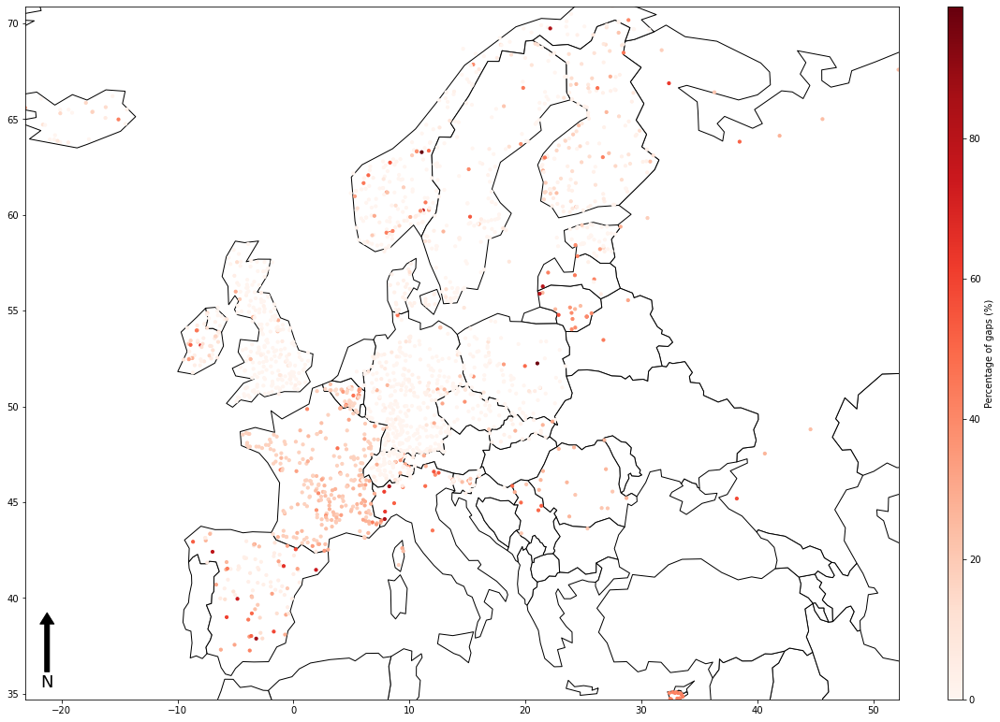

In [13]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations, crsproj = 'epsg:4326', backmapproj = False, 
                                       figsizeproj = (23.4, 23.4), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = -3.5, markersize_map = 10,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

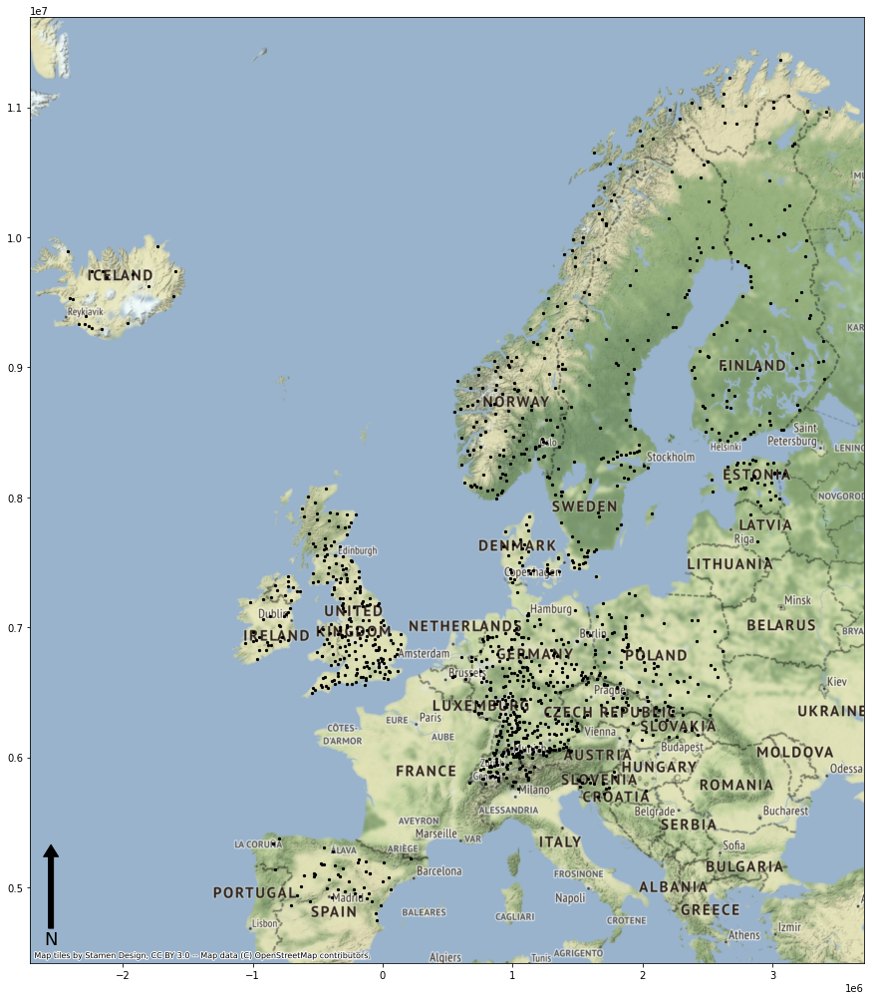

In [14]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.PercentageGaps < 10.0], showcodes = False,  
                                  backmapproj = True,
                                  markersize_map = 5, 
                                  north_arrow = True, 
                                  set_map_limits = True,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

In [15]:
network_cond_3 = network_cond_2.set_index("grdc_no")
network_cond_3

,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,d_start,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
grdc_no,,,,,,,,,,,,,,,,,,,,,
6118130,6,6180,ABER VRAC'H,DRENNEC,FR,48.530410,-4.362693,24.0,90.60,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.448,0.014128128,588.672
6118150,6,6180,GUILLEC,TREZILIDE,FR,48.615037,-4.077011,43.0,91.10,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.682,0.021507552,500.1756279069768
6118160,6,6180,PENZE,TAULE (PENHOAT),FR,48.584822,-3.924127,141.0,61.97,1967-01-01,...,NaN,NaN,NaN,NaN,1967,2012,46,2.813,0.08871076800000001,629.1543829787234
6118165,6,6180,RISLE,RAI,FR,48.747942,0.580580,149.0,255.45,1965-01-01,...,NaN,NaN,NaN,NaN,1965,2012,48,1.379,0.043488144,291.8667382550336
6118175,6,6180,JARLOT,PLOUGONVEN,FR,48.565562,-3.800485,44.0,73.86,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.712,0.022453632,510.3098181818181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6971130,6,6712,TULOMA,VERKHNE-TULOMSKIY GES,RU,68.600000,31.750000,17500.0,-999.00,1935-01-01,...,1934.0,2017.0,84.0,25.349301,1934,2017,84,193.903,6.114925008,349.4242861714285
6971600,6,6713,VARZUGA,VARZUGA,RU,66.400000,36.300000,7940.0,9.00,1979-01-01,...,1935.0,1992.0,58.0,0.288600,1935,2011,77,91.75,2.893428,364.4115869017632
6977100,6,6771,VOLGA,VOLGOGRAD POWER PLANT,RU,48.804722,44.585833,1360000.0,-999.00,1962-01-01,...,1879.0,1984.0,106.0,17.924528,1879,2010,132,7827.676,246.853590336,181.5099928941177


In [16]:
summarygapsstations["Country"] = network_cond_3.country
summarygapsstations["area"] = network_cond_3.area

summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0
...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0


In [17]:
idcondition = summarygapsstations[summarygapsstations.Country == "IS"].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6401070,6401080,6401090,6401111,6401120,6401130,6401140,6401150,6401160,6401200,...,6401400,6401440,6401460,6401500,6401600,6401601,6401610,6401702,6401703,6401800
1981-01-01,4.31,60.02,273.80,53.56,246.37,1.74,14.1,34.44,0.244,11.60,...,19.22,NaN,7.0,5.59,NaN,4.74,NaN,NaN,NaN,0.00
1981-01-02,4.31,60.60,270.08,54.88,260.29,1.74,14.0,34.44,0.236,10.90,...,18.41,NaN,7.0,5.39,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-03,4.31,60.60,273.80,54.88,262.66,1.74,14.0,34.44,0.229,9.79,...,18.41,NaN,7.0,5.39,NaN,4.60,NaN,NaN,NaN,0.00
1981-01-04,4.31,60.60,273.80,53.56,277.14,1.64,14.0,35.38,0.228,10.90,...,19.22,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-05,4.84,60.60,277.53,50.96,274.69,1.64,14.0,35.38,0.227,12.00,...,18.41,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209.41
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.71
2021-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.75
2021-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.07


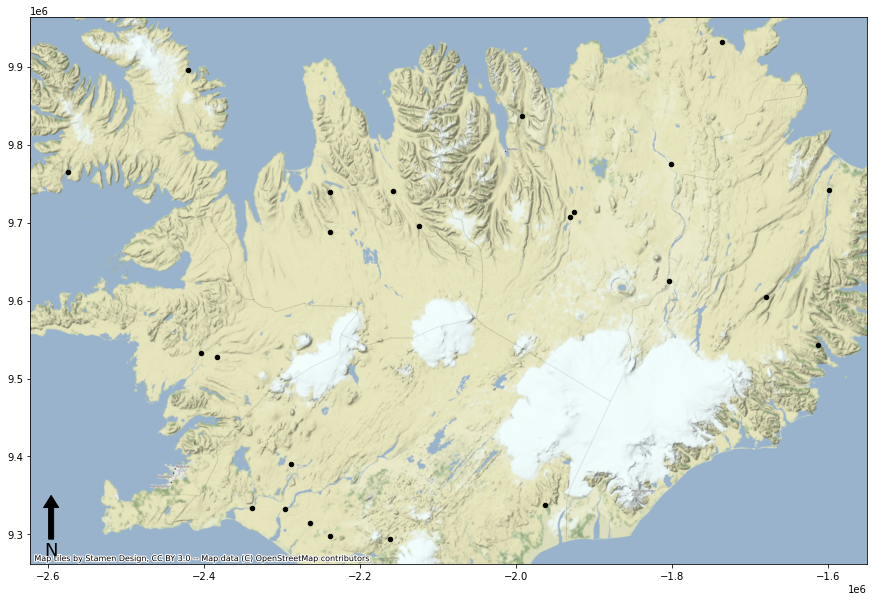

In [18]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IS"], showcodes = False,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

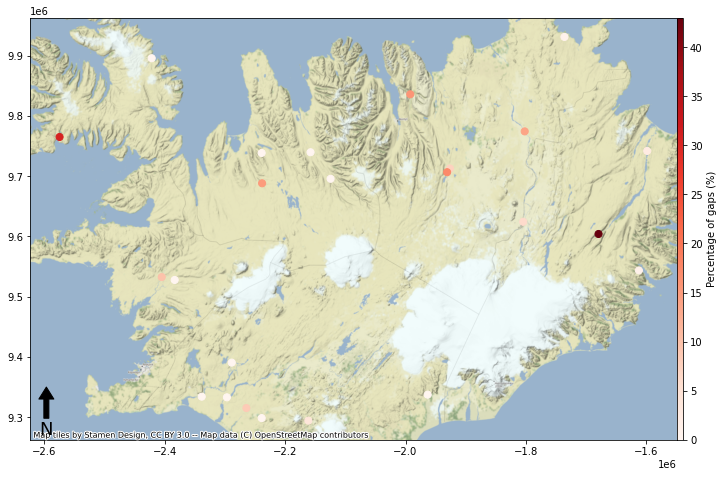

In [19]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IS"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 50,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [20]:
timeseriesfinalcondition

,6401070,6401080,6401090,6401111,6401120,6401130,6401140,6401150,6401160,6401200,...,6401400,6401440,6401460,6401500,6401600,6401601,6401610,6401702,6401703,6401800
1981-01-01,4.31,60.02,273.80,53.56,246.37,1.74,14.1,34.44,0.244,11.60,...,19.22,NaN,7.0,5.59,NaN,4.74,NaN,NaN,NaN,0.00
1981-01-02,4.31,60.60,270.08,54.88,260.29,1.74,14.0,34.44,0.236,10.90,...,18.41,NaN,7.0,5.39,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-03,4.31,60.60,273.80,54.88,262.66,1.74,14.0,34.44,0.229,9.79,...,18.41,NaN,7.0,5.39,NaN,4.60,NaN,NaN,NaN,0.00
1981-01-04,4.31,60.60,273.80,53.56,277.14,1.64,14.0,35.38,0.228,10.90,...,19.22,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-05,4.84,60.60,277.53,50.96,274.69,1.64,14.0,35.38,0.227,12.00,...,18.41,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209.41
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.71
2021-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.75
2021-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.07


In [21]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0
...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0


At this point we can convert our streamflow dataset from m3/s to mm/day:

First check if we have the area of our catchments:

In [81]:
summarygapsstations.area.replace(-999.0, np.nan, inplace=True)

print("There are", summarygapsstations.area.isna().sum(), "stations without area assigned in our dataframe")

There are 16 stations without area assigned in our dataframe


In [23]:
#%% #### 1. Define a function to convert streamflow from cubic meters per seconds (m3/s) to milimiters per day (mm/day):

def Q_from_m3s_mmday(timeseries_m3s, stations_infos):
    """
    Inputs
    ------------------
    timeseries_m3s = dataframe[Index = Datetime; columns = [stations-codes]]; 
    stations_infos = dataframe[Index = [stations-codes]; columns = [...,....,area]];
    
    Returns
    --------------------
    timeseries_mmday = dataframe[Index = Datetime; columns = [stations-codes]] 
        
    """   
    timeseries_mmday = (timeseries_m3s * 1000 * 24 * 3600) / (stations_infos.loc[timeseries_m3s.columns, "area"] * 1000 * 1000)
    
    return timeseries_mmday

In [24]:
timeseries_mmday = Q_from_m3s_mmday(timeseries_m3s = timeseriesfinal_used, stations_infos = summarygapsstations)

In [25]:
timeseries_mmday.loc[datetime.date(1981, 10, 1):datetime.date(2021, 9, 30), :]

,6118130,6118150,6118160,6118165,6118175,6118185,6118195,6118205,6118230,6119010,...,6970100,6970250,6970500,6970700,6970869,6971130,6971600,6977100,6978250,6983350
1981-10-01,2.1960,3.255070,1.605447,0.405906,0.893455,0.168585,0.696686,1.653791,NaN,1.795107,...,0.279210,0.412138,0.539234,0.991385,0.607135,1.017051,1.371083,0.344329,0.137829,0.616116
1981-10-02,2.1708,3.074233,0.955915,0.405906,0.693164,0.222322,0.602057,1.706798,NaN,1.811883,...,0.279210,0.414621,0.586723,1.002462,0.553761,0.794880,1.316675,0.347506,0.140571,0.616116
1981-10-03,1.0692,1.336186,0.686298,0.405906,0.551782,0.145405,0.569143,1.473571,NaN,1.677670,...,0.266801,0.419586,0.626553,1.010769,0.577112,0.710949,1.196977,0.362753,0.133943,0.619709
1981-10-04,0.9108,0.769563,0.588255,0.371114,0.471273,0.121171,0.522514,1.420564,NaN,1.556878,...,0.257494,0.417103,0.652596,1.019077,0.480371,0.735634,1.077280,0.371012,0.134629,0.616116
1981-10-05,0.8640,0.649005,0.416681,0.440698,0.422182,0.104312,0.469029,1.367558,NaN,1.469639,...,0.249738,0.414621,0.652596,1.030154,0.560432,0.908434,1.022872,0.375459,0.137829,0.610728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<module 'matplotlib.pyplot' from 'C:\\Users\\nascimth\\AppData\\Local\\miniconda3\\envs\\geopandas\\lib\\site-packages\\matplotlib\\pyplot.py'>

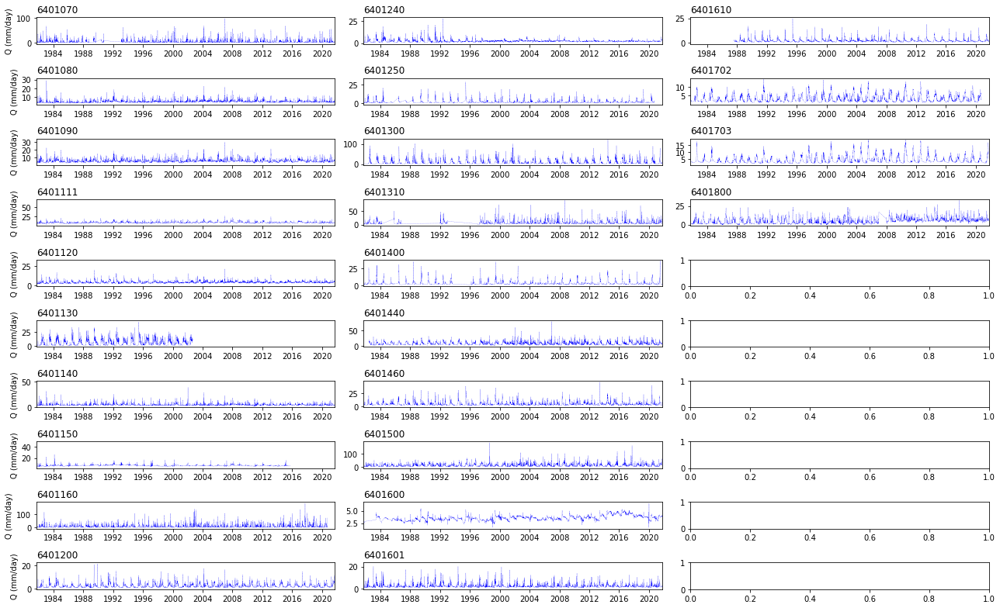

In [26]:
geospatialfunctions.plottimeseries(numr = 10, numc = 3, datatoplot = timeseries_mmday.loc[:, timeseriesfinalcondition.columns], 
                                   setylim = False, ymin = 0, ymax = 200, figsizeproj = (18, 11),
                                   colorgraph = "blue", linewidthproj = 0.2, linestyleproj = "-.",  
                                   ylabelplot = "Q (mm/day)", 
                                   datestart = datetime.date(1981, 10, 1), dateend = datetime.date(2021, 9, 30),
                                   setnumberofintervals = False, numberintervals = 2,
                                   fontsize_plot = 10)

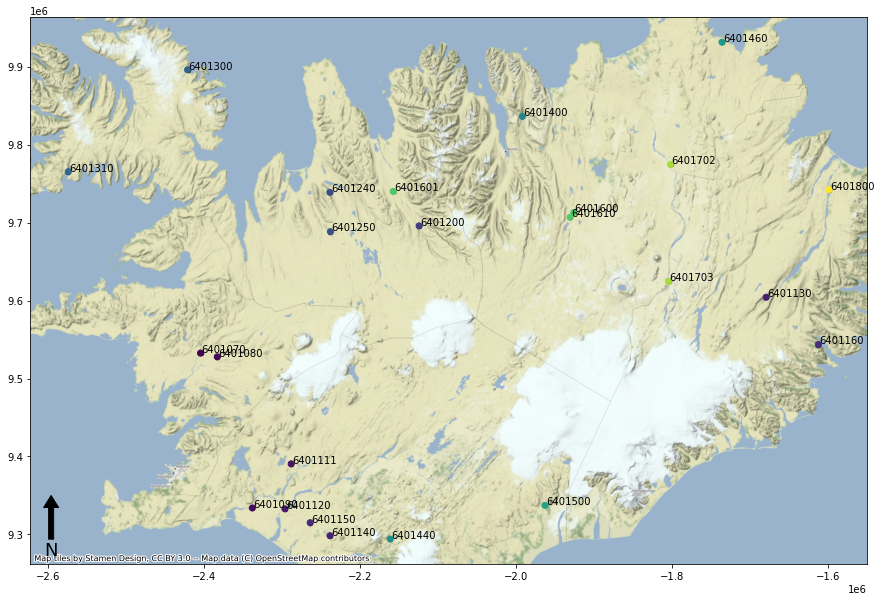

In [27]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IS"], showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

Let's check our dataset for Ireland:

In [28]:
idcondition = summarygapsstations[summarygapsstations.Country == "IE"].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6502101,6502110,6502141,6502150,6502151,6502160,6502170,6502171,6502810,6503100,...,6503370,6503400,6503410,6503500,6503501,6503800,6503851,6503852,6503853,6503855
1981-01-01,NaN,NaN,33.18,42.48,37.06,35.35,NaN,28.728,11.72,195.340,...,8.06,NaN,5.04,77.68,40.91,3.04,60.25,52.24,26.85,26.88
1981-01-02,NaN,NaN,30.88,38.05,33.11,34.41,NaN,27.619,10.99,185.767,...,7.37,NaN,5.02,74.28,38.46,2.93,56.21,45.27,26.67,25.22
1981-01-03,NaN,NaN,29.83,34.06,30.00,33.14,NaN,25.280,10.94,189.881,...,6.93,NaN,5.24,74.69,42.89,2.95,54.94,38.12,25.55,25.49
1981-01-04,NaN,NaN,28.23,30.63,26.66,32.21,NaN,23.166,10.06,183.198,...,6.66,NaN,4.98,74.04,37.24,2.49,50.87,34.47,23.72,23.70
1981-01-05,NaN,NaN,26.01,27.72,23.95,30.93,NaN,21.738,9.32,173.074,...,6.04,NaN,4.61,67.30,34.49,2.13,47.09,30.58,21.64,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,36.38,NaN,NaN,NaN,NaN,112.700,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,NaN,39.08,NaN,NaN,NaN,NaN,115.970,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,NaN,NaN,NaN,NaN,42.29,NaN,NaN,NaN,NaN,109.440,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,NaN,45.73,NaN,NaN,NaN,NaN,117.250,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


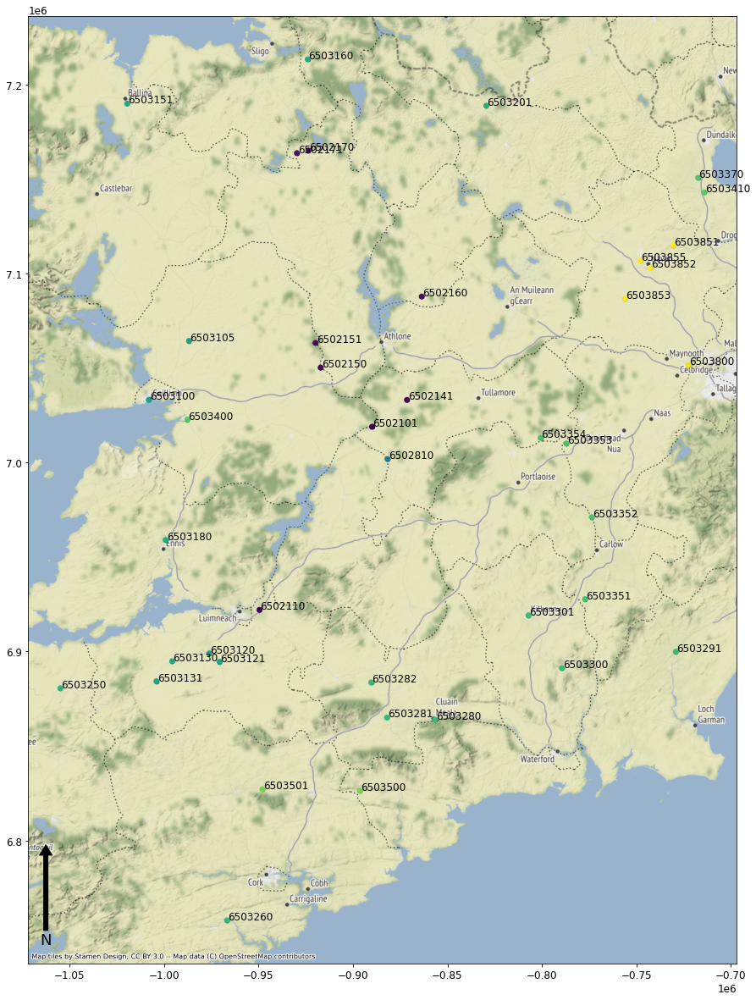

In [29]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IE"], showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

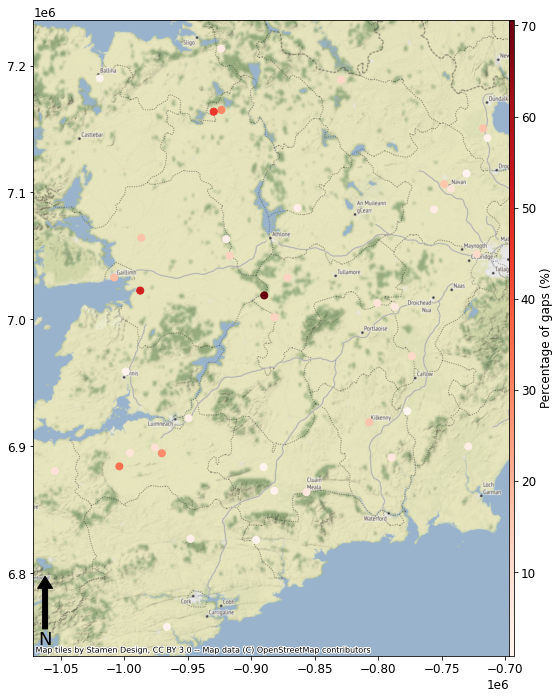

In [34]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IE"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 50,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

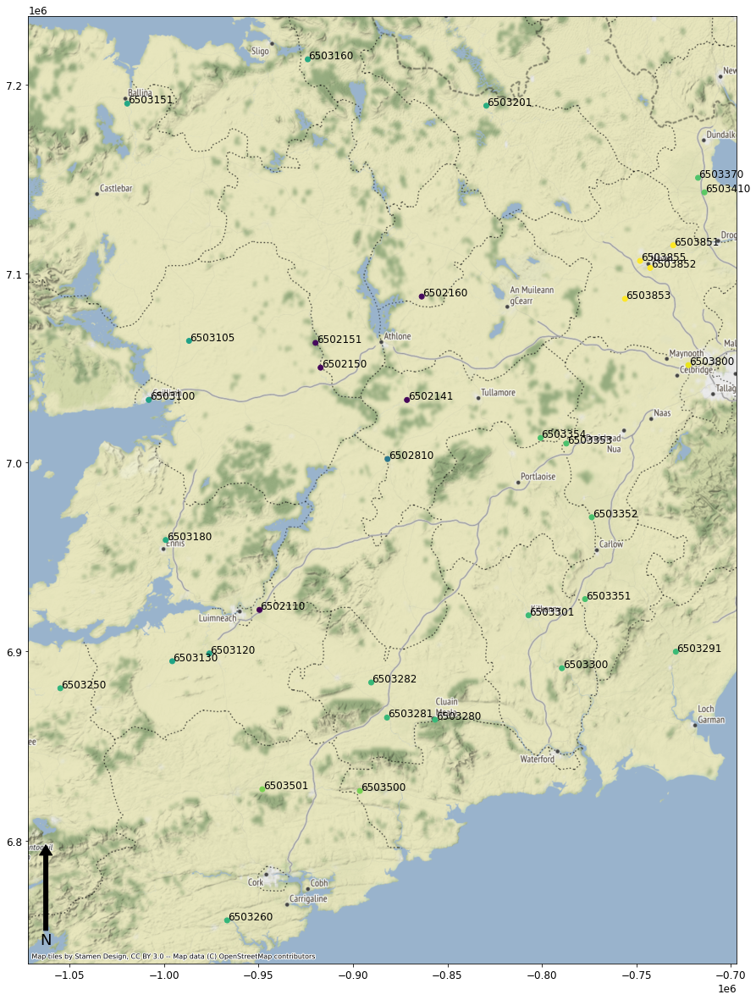

In [43]:
summarygapsstations_to_plot = summarygapsstations[summarygapsstations.Country == "IE"]

geospatialfunctions.plotpointsmap(summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0],
                                  showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 5, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

In [44]:
idcondition = summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6502110,6502141,6502150,6502151,6502160,6502810,6503100,6503105,6503120,6503130,...,6503354,6503370,6503410,6503500,6503501,6503800,6503851,6503852,6503853,6503855
1981-01-01,NaN,33.18,42.48,37.06,35.35,11.72,195.340,25.16,15.08,8.37,...,10.31,8.06,5.04,77.68,40.91,3.04,60.25,52.24,26.85,26.88
1981-01-02,NaN,30.88,38.05,33.11,34.41,10.99,185.767,22.68,14.58,8.84,...,8.71,7.37,5.02,74.28,38.46,2.93,56.21,45.27,26.67,25.22
1981-01-03,NaN,29.83,34.06,30.00,33.14,10.94,189.881,21.62,14.47,14.69,...,9.29,6.93,5.24,74.69,42.89,2.95,54.94,38.12,25.55,25.49
1981-01-04,NaN,28.23,30.63,26.66,32.21,10.06,183.198,19.68,12.46,10.76,...,7.45,6.66,4.98,74.04,37.24,2.49,50.87,34.47,23.72,23.70
1981-01-05,NaN,26.01,27.72,23.95,30.93,9.32,173.074,17.44,11.25,9.35,...,6.78,6.04,4.61,67.30,34.49,2.13,47.09,30.58,21.64,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,36.38,NaN,NaN,112.700,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,39.08,NaN,NaN,115.970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,NaN,NaN,NaN,42.29,NaN,NaN,109.440,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,45.73,NaN,NaN,117.250,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<module 'matplotlib.pyplot' from 'C:\\Users\\nascimth\\AppData\\Local\\miniconda3\\envs\\geopandas\\lib\\site-packages\\matplotlib\\pyplot.py'>

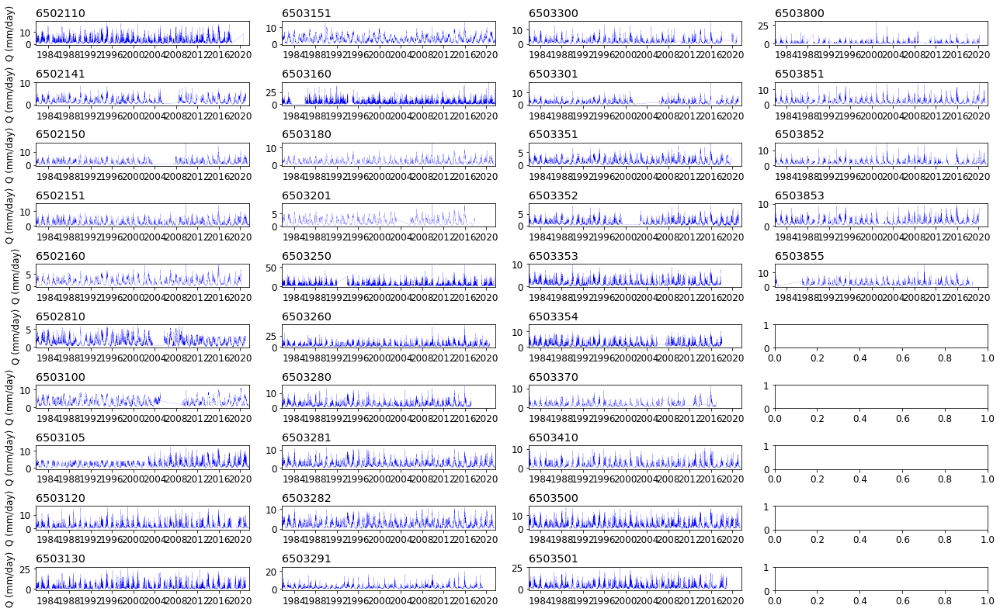

In [45]:
geospatialfunctions.plottimeseries(numr = 10, numc = 4, datatoplot = timeseries_mmday.loc[:, timeseriesfinalcondition.columns], 
                                   setylim = False, ymin = 0, ymax = 200, figsizeproj = (18, 11),
                                   colorgraph = "blue", linewidthproj = 0.2, linestyleproj = "-.",  
                                   ylabelplot = "Q (mm/day)", 
                                   datestart = datetime.date(1981, 10, 1), dateend = datetime.date(2021, 9, 30),
                                   setnumberofintervals = False, numberintervals = 2,
                                   fontsize_plot = 10)

In [46]:
summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0]

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6502110,-8.529147,52.669276,543.0,3.912386,POINT (-8.52915 52.66928),IE,646.0
6502141,-7.828063,53.269937,1714.0,12.349593,POINT (-7.82806 53.26994),IE,1207.0
6502150,-8.238554,53.361687,1794.0,12.926003,POINT (-8.23855 53.36169),IE,1184.0
6502151,-8.262762,53.431764,494.0,3.559334,POINT (-8.26276 53.43176),IE,1050.0
6502160,-7.757923,53.562867,522.0,3.761078,POINT (-7.75792 53.56287),IE,1071.0
6502810,-7.920462,53.101742,1704.0,12.277542,POINT (-7.92046 53.10174),IE,493.0
6503100,-9.055670,53.269980,2506.0,18.056056,POINT (-9.05567 53.26998),IE,3111.0
6503105,-8.863839,53.437557,2319.0,16.708697,POINT (-8.86384 53.43756),IE,695.0
6503120,-8.767416,52.543441,1262.0,9.092874,POINT (-8.76742 52.54344),IE,805.0


In [48]:
summarygapsstations_to_plot

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6502101,-7.993647,53.193787,9801.0,70.617480,POINT (-7.99365 53.19379),IE,7989.0
6502110,-8.529147,52.669276,543.0,3.912386,POINT (-8.52915 52.66928),IE,646.0
6502141,-7.828063,53.269937,1714.0,12.349593,POINT (-7.82806 53.26994),IE,1207.0
6502150,-8.238554,53.361687,1794.0,12.926003,POINT (-8.23855 53.36169),IE,1184.0
6502151,-8.262762,53.431764,494.0,3.559334,POINT (-8.26276 53.43176),IE,1050.0
6502160,-7.757923,53.562867,522.0,3.761078,POINT (-7.75792 53.56287),IE,1071.0
6502170,-8.296673,53.972839,4124.0,29.713956,POINT (-8.29667 53.97284),IE,533.0
6502171,-8.351199,53.965631,6334.0,45.637294,POINT (-8.35120 53.96563),IE,520.0
6502810,-7.920462,53.101742,1704.0,12.277542,POINT (-7.92046 53.10174),IE,493.0


TypeError: cannot convert the series to <class 'float'>

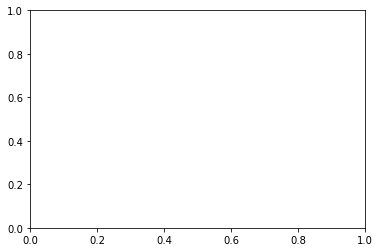

In [49]:
summarygapsstations_to_plot["PercentageGaps"].plot(markersize=summarygapsstations_to_plot['area'])


In [50]:
summarygapsstations_to_plot['area']

Code
6502101    7989.0
6502110     646.0
6502141    1207.0
6502150    1184.0
6502151    1050.0
6502160    1071.0
6502170     533.0
6502171     520.0
6502810     493.0
6503100    3111.0
6503105     695.0
6503120     805.0
6503121     770.3
6503130     426.0
6503131     366.2
6503151    1911.0
6503160     294.0
6503180     562.0
6503201    1501.0
6503250     646.0
6503260     431.0
6503280    2143.9
6503281    1602.0
6503282    1090.5
6503291    1036.0
6503300    2388.0
6503301    1605.0
6503351    2415.0
6503352    1660.0
6503353    1096.0
6503354     406.0
6503370     321.0
6503400     373.0
6503410     307.0
6503500    2338.0
6503501    1258.0
6503800     215.0
6503851    2408.0
6503852    1610.0
6503853    1282.0
6503855     717.0
Name: area, dtype: float64

In [71]:
def plotgapsmap_withcircles(summarygapsstations: pd.pandas.core.frame.DataFrame, crsproj = 'epsg:4326', 
             backmapproj = True, figsizeproj = (20, 100), 
             cmapproj = "Reds", pad_map = -0.01, markersize_map = 10, 
             legend_title = "Percentage of gaps (%)", legend_orientation = "vertical",
             set_map_limits = False, minx = 0, miny = 0, maxx = 1, maxy = 1,
             north_arrow = True):
    
    """
    Inputs
    ------------------
    summarygapsstations: dataset[y x 4]: 
        The same dataframe output from the fillinggaps.summarygaps function.
    
    Returns
    --------------------
    plt.plot: The output is a plt.plot with the points spatially distributed in the area, and with a legend bar 
        showing the percentage of gaps (from 1 to 100). A background map can be also shown if your coordinate system 
        "crsproj" is set to 'epsg:4326'.
        
    """
    if backmapproj == True:
        
        
        crs = {'init': crsproj}
        geometry = [Point(xy) for xy in zip(summarygapsstations["CoordX"], summarygapsstations["CoordY"])]
        geodata=gpd.GeoDataFrame(summarygapsstations,crs=crs, geometry=geometry)
        geodatacond = geodata

        # The conversiojn is needed due to the projection of the basemap:
        geodatacond = geodatacond.to_crs(epsg=3857)

        # Plot the figure and set size:
        fig, ax = plt.subplots(figsize = figsizeproj)

        #Organizing the legend:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="1%", pad = pad_map)

        #Ploting:
        geodatacond.plot(ax=ax, column='PercentageGaps', legend=True, cax = cax, cmap = "Reds", 
                         legend_kwds={'label': legend_title,
                        'orientation': legend_orientation}, markersize = summarygapsstations['area']/markersize_map)
        cx.add_basemap(ax)
        
        if set_map_limits == False:
            pass
        
        else:
            ax.set_xlim(minx, maxx)
            ax.set_ylim(miny, maxy)  
        
    else:
        crs = {'init': crsproj}
        geometry = [Point(xy) for xy in zip(summarygapsstations["CoordX"], summarygapsstations["CoordY"])]
        geodata=gpd.GeoDataFrame(summarygapsstations,crs=crs, geometry=geometry)
        geodatacond = geodata

        # Plot the figure and set size:
        fig, ax = plt.subplots(figsize = figsizeproj)

        #Organizing the legend:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="1%", pad= pad_map)
        
        #Ploting:
        world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
        world.plot(ax = ax, color='white', edgecolor='black')
        
        geodatacond.plot(ax=ax, column='PercentageGaps', legend=True, cax = cax, cmap = cmapproj, 
                         legend_kwds={'label': legend_title,
                        'orientation': legend_orientation},
                         markersize = summarygapsstations['area']/markersize_map)
        
        if set_map_limits == False:
            minx, miny, maxx, maxy = geodatacond.total_bounds
        
        else:
            pass
        
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
    
    # Plot the north arrow:
    if north_arrow == True:
        x, y, arrow_length = 0.025, 0.125, 0.1
        
        ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
        arrowprops=dict(facecolor='black', width=5, headwidth=15),
        ha='center', va='center', fontsize=18,
        xycoords=ax.transAxes)
    else:
        pass  

        # This part is for the scale bar:
        #from matplotlib_scalebar.scalebar import ScaleBar

        #from shapely.geometry.point import Point as Point2

        #points = gpd.GeoSeries([Point(-74.20, 40.5), Point(-74.5, 40.5)], crs=4326)  # Geographic WGS 84 - degrees
        #points = points.to_crs(32619) # Projected WGS 84 - meters
        
        #distance_meters = points[0].distance(points[1])

        #ax.add_artist(ScaleBar(distance_meters, dimension="si-length", units="km"))
        
    return plt

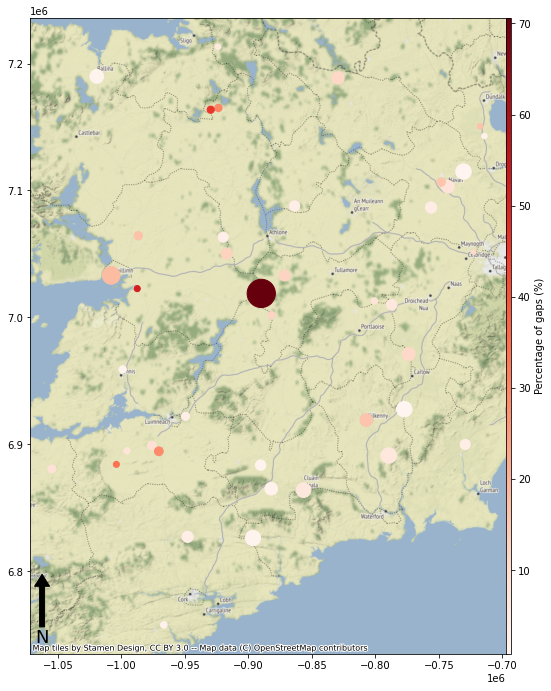

In [72]:
plot = plotgapsmap_withcircles(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IE"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 10,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [73]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0
...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0


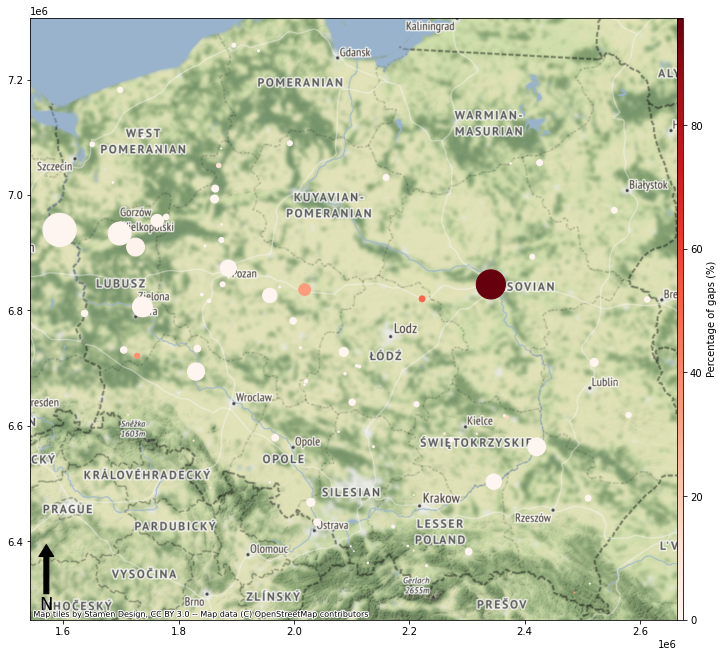

In [91]:
plot = plotgapsmap_withcircles(summarygapsstations = summarygapsstations[summarygapsstations.Country == "PL"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 100,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

<AxesSubplot:xlabel='Code'>

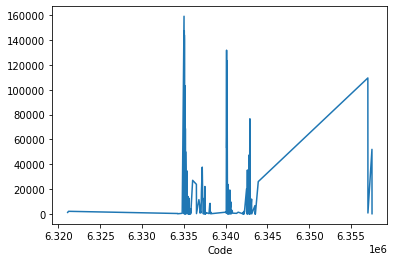

In [83]:
summarygapsstations[summarygapsstations.Country == "DE"].area.plot()

In [84]:
summarygapsstations[summarygapsstations.Country == "DE"].area

Code
6321100    1203.0
6321200    2105.0
6334270     352.0
6334280     134.0
6334800     481.0
            ...  
6357501    4080.0
6357502    1621.0
6357503     376.0
6357510     162.0
6357520       NaN
Name: area, Length: 320, dtype: float64

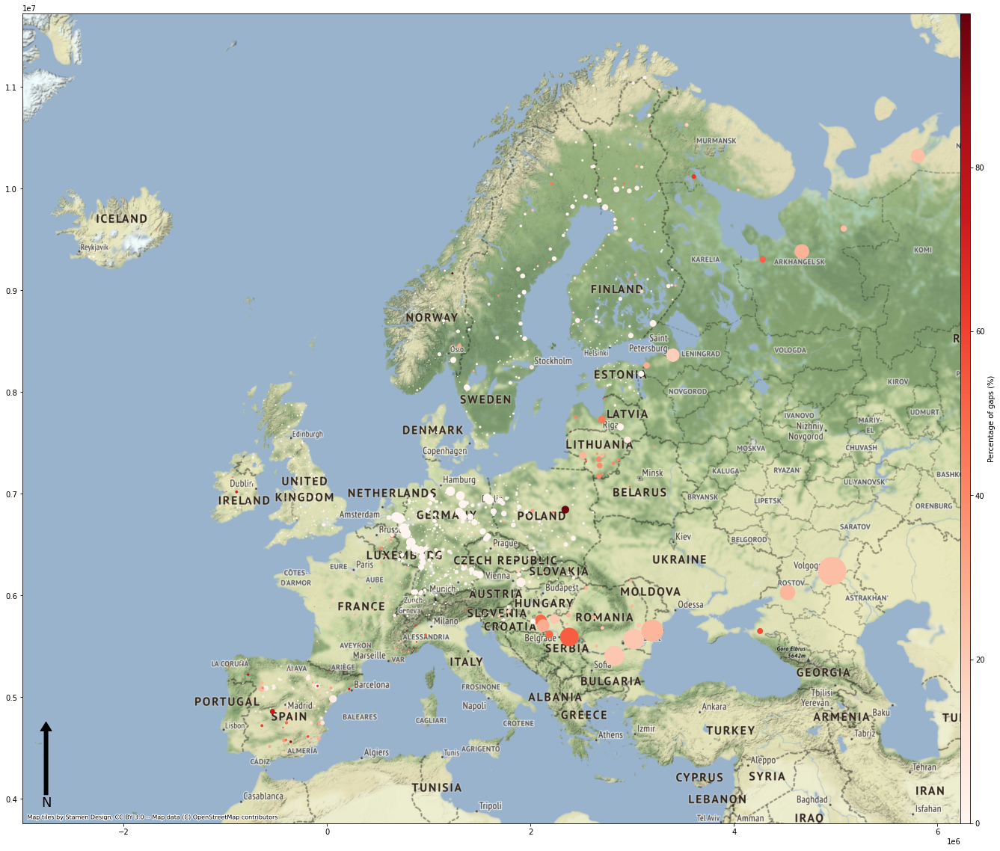

In [92]:
plot = plotgapsmap_withcircles(summarygapsstations = summarygapsstations,
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (22.7, 22.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 1000,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()